# Case Study: Investigating Distributions in NDT7 and Cloudflare AIM Data

This code investigates and compares the distributions of data from two sources:

1. **NDT7 dataset**: Contains network performance measurements, such as latency and throughput.
2. **Cloudflare AIM dataset**: Provides performance data from Cloudflare’s network, including server response times and packet loss.

### Objective:
The primary goal is to explore the distribution of the **merged dataset** and check how the individual distributions compare with the merged one.

### Steps:
1. **Distribution Comparison**: We will visualize the distributions of key features from both datasets and the merged dataset.
2. **Merging**: Finally, we will merge the datasets and compare the overall distribution.

The analysis will help determine whether combining the datasets affects their individual distributions or if they align in meaningful ways.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

In [2]:
ndt7_download = pd.read_csv("data/ndt7_download_case_study.csv")
ndt7_upload = pd.read_csv("data/ndt7_upload_case_study.csv")
cf_data_mean = pd.read_csv("data/cloudflare_case_study_mean.csv")
cf_data_median = pd.read_csv("data/cloudflare_case_study_median.csv")
cf_data_90th_percentile = pd.read_csv("data/cloudflare_case_study_90th_percentile.csv")

countries = np.union1d(
    ndt7_download['country_iso'].unique(),
    cf_data_mean['country_iso'].unique()
)

continents = np.union1d(
    ndt7_download['continent'].unique(),
    cf_data_mean['continent'].unique()
)

download_study_fields = ["packet_loss_rate", "download_throughput_mbps", "download_latency_ms", "download_jitter"]
upload_study_fields = ["packet_loss_rate", "upload_throughput_mbps", "upload_latency_ms", "upload_jitter"]

download_fields_info = {
    "packet_loss_rate": {
        "title": "Packet Loss Rate",
    },
    "download_throughput_mbps": {
        "title": "Download Throughput",
        "measure_unit": "Mbps"
    },
    "download_latency_ms": {
        "title": "Download Latency",
        "measure_unit": "ms"
    },
    "download_jitter": {
        "title": "Download Jitter",
        "measure_unit": "ms"
    }
}

upload_fields_info = {
    "packet_loss_rate": {
        "title": "Packet Loss Rate",
    },
    "upload_throughput_mbps": {
        "title": "Upload Throughput",
        "measure_unit": "Mbps"
    },
    "upload_latency_ms": {
        "title": "Upload Latency",
        "measure_unit": "ms"
    },
    "upload_jitter": {
        "title": "Upload Jitter",
        "measure_unit": "ms"
    }
}

In [3]:
def get_histogram(data, bin_width=None):
    num_bins = 100
    if bin_width is not None:
        num_bins = int((np.max(data) - np.min(data)) / bin_width)
    return np.histogram(data,bins=num_bins, density=True)

In [4]:
def plot_pdfs_with_merged(ndt7, cf, continent: str, is_download: bool):
    legend_added = False
    fig, axes = plt.subplots(1, 4, figsize=(20, 4))

    study_fields = download_study_fields if is_download else upload_study_fields
    fields_info = download_fields_info if is_download else upload_fields_info
    for i, attribute_name in enumerate(study_fields):
        title = f'{fields_info[attribute_name]["title"]} ({continent})'
        measure_unit = fields_info[attribute_name].get("measure_unit")
        x_label = f'{fields_info[attribute_name]["title"]} ({measure_unit})' if measure_unit else f'{fields_info[attribute_name]["title"]}'

        ndt7_filtered = ndt7[ndt7['continent'] == continent][[attribute_name]].copy().dropna()
        cf_filtered = cf[cf['continent'] == continent][[attribute_name]].copy().dropna()
        if continent not in continents:
            ndt7_filtered = ndt7[[attribute_name]].copy().dropna()
            cf_filtered = cf[[attribute_name]].copy().dropna()
        merged_data = pd.concat([ndt7_filtered, cf_filtered], ignore_index=True)

        counts_ndt7, bin_edges_ndt7 = get_histogram(ndt7_filtered[attribute_name].dropna())
        ndt_bin_width = bin_edges_ndt7[1] - bin_edges_ndt7[0]
        counts_cf, bin_edges_cf = get_histogram(cf_filtered[attribute_name].dropna(), bin_width=ndt_bin_width)
        counts_merged, bin_edges_merged = get_histogram(merged_data[attribute_name], bin_width=ndt_bin_width)

        upper_limit = np.percentile(merged_data[attribute_name].dropna(), 95)
        if upper_limit == 0:
            upper_limit = np.max(merged_data[attribute_name])
        lower_limit = 0

        ax = axes[i]
        if not legend_added:
            ax.plot(bin_edges_ndt7[:-1], counts_ndt7, label='NDT7', alpha=0.5, color='#1f77b4')
            ax.plot(bin_edges_cf[:-1], counts_cf, label='Cloudflare', alpha=0.5, color='green')
            ax.plot(bin_edges_merged[:-1], counts_merged, label='Merged', alpha=0.5, color='saddlebrown', linestyle='--')
            legend_added = True
        else:
            ax.plot(bin_edges_ndt7[:-1], counts_ndt7, alpha=0.5, color='#1f77b4')
            ax.plot(bin_edges_cf[:-1], counts_cf, alpha=0.5, color='green')
            ax.plot(bin_edges_merged[:-1], counts_merged, alpha=0.5, color='saddlebrown', linestyle='--')
        ax.set_title(f'{title} PDFs')
        ax.set_xlabel(x_label)
        ax.set_ylabel('Density')
        ax.set_xlim(lower_limit, upper_limit)
        ax.grid(True, linestyle='--', alpha=0.2)

    fig.suptitle(f'{'Download' if is_download else 'Upload'} Measurement Distributions ({continent})', fontsize=16)
    plt.tight_layout()
    fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0.0), ncol=3)
    plt.show()

In [5]:
def plot_pdfs_with_all_cf_aggregations(ndt7, cf_mean, cf_median, cf_90, continent: str, is_download: bool):
    legend_added = False
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    study_fields = download_study_fields if is_download else upload_study_fields
    study_fields = [x for x in study_fields if x not in {'packet_loss_rate', 'download_jitter', 'upload_jitter'}]
    fields_info = download_fields_info if is_download else upload_fields_info
    for i, attribute_name in enumerate(study_fields):
        title = f'{fields_info[attribute_name]["title"]} ({continent})'
        measure_unit = fields_info[attribute_name].get("measure_unit")
        x_label = f'{fields_info[attribute_name]["title"]} ({measure_unit})' if measure_unit else f'{fields_info[attribute_name]["title"]}'

        ndt7_filtered = ndt7[ndt7['continent'] == continent][[attribute_name]].copy().dropna()
        cf_mean_filtered = cf_mean[cf_mean['continent'] == continent][[attribute_name]].copy().dropna()
        cf_median_filtered = cf_median[cf_median['continent'] == continent][[attribute_name]].copy().dropna()
        cf_90_filtered = cf_90[cf_90['continent'] == continent][[attribute_name]].copy().dropna()
        if continent not in continents:
            ndt7_filtered = ndt7[[attribute_name]].copy().dropna()
            cf_mean_filtered = cf_mean[[attribute_name]].copy().dropna()
            cf_median_filtered = cf_median[[attribute_name]].copy().dropna()
            cf_90_filtered = cf_90[[attribute_name]].copy().dropna()

        counts_ndt7, bin_edges_ndt7 = get_histogram(ndt7_filtered[attribute_name].dropna())
        ndt_bin_width = bin_edges_ndt7[1] - bin_edges_ndt7[0]
        counts_cf_mean, bin_edges_cf_mean = get_histogram(cf_mean_filtered[attribute_name].dropna(), bin_width=ndt_bin_width)
        counts_cf_median, bin_edges_cf_median = get_histogram(cf_median_filtered[attribute_name].dropna(), bin_width=ndt_bin_width)
        counts_cf_90, bin_edges_cf_90 = get_histogram(cf_90_filtered[attribute_name].dropna(), bin_width=ndt_bin_width)

        lower_limit = 0
        upper_limit = np.percentile(ndt7[attribute_name].dropna(), 95)
        if upper_limit == 0:
            upper_limit = np.max(ndt7[attribute_name])

        ax = axes[i]
        if not legend_added:
            ax.plot(bin_edges_ndt7[:-1], counts_ndt7, label='NDT7', alpha=0.8, color='#1f77b4')
            ax.plot(bin_edges_cf_mean[:-1], counts_cf_mean, label='Cloudflare Mean', alpha=0.8, color='#ff7f0e', linestyle='--')
            ax.plot(bin_edges_cf_median[:-1], counts_cf_median, label='Cloudflare Median', alpha=0.8, color='#2ca02c')
            ax.plot(bin_edges_cf_90[:-1], counts_cf_90, label='Cloudflare 90th Percentile', alpha=0.8, color='#9467bd', linestyle='--')
            legend_added = True
        else:
            ax.plot(bin_edges_ndt7[:-1], counts_ndt7, alpha=0.8, color='#1f77b4')
            ax.plot(bin_edges_cf_mean[:-1], counts_cf_mean, alpha=0.8, color='#ff7f0e', linestyle='--')
            ax.plot(bin_edges_cf_median[:-1], counts_cf_median, alpha=0.8, color='#2ca02c')
            ax.plot(bin_edges_cf_90[:-1], counts_cf_90, alpha=0.8, color='#9467bd', linestyle='--')
        ax.set_xlabel(x_label, fontsize=20)
        if i == 0:
            ax.set_ylabel('Density', fontsize=20)
        ax.set_xlim(lower_limit, upper_limit)
        ax.grid(True, linestyle='--', alpha=0.2)

    fig.suptitle(f'{'Download' if is_download else 'Upload'} Measurement Distributions ({continent})', fontsize=16)
    plt.tight_layout()
    fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0.0), ncol=4, fontsize=20)
    plt.show()

In [6]:
def plot_throughput_with_all_cf_aggregations(is_download: bool):
    legend_added = False
    size = len(continents)
    fig, axes = plt.subplots(size, 3, figsize=(21, 20))
    ndt7 = ndt7_download if is_download else ndt7_upload
    field = 'download_throughput_mbps' if is_download else 'upload_throughput_mbps'
    for i, continent in enumerate(continents):
        ndt7_filtered = ndt7[ndt7['continent'] == continent][[field]].copy().dropna()
        cf_mean_filtered = cf_data_mean[cf_data_mean['continent'] == continent][[field]].copy().dropna()
        cf_median_filtered = cf_data_median[cf_data_median['continent'] == continent][[field]].copy().dropna()
        cf_90_filtered = cf_data_90th_percentile[cf_data_90th_percentile['continent'] == continent][[field]].copy().dropna()

        counts_ndt7, bin_edges_ndt7 = get_histogram(ndt7_filtered[field])
        ndt_bin_width = bin_edges_ndt7[1] - bin_edges_ndt7[0]

        counts_cf_mean, bin_edges_cf_mean = get_histogram(cf_mean_filtered[field], ndt_bin_width)
        counts_cf_median, bin_edges_cf_median = get_histogram(cf_median_filtered[field], ndt_bin_width)
        counts_cf_90, bin_edges_cf_90 = get_histogram(cf_90_filtered[field], ndt_bin_width)

        lower_limit = 0
        upper_limit = max(1,
            np.max(cf_mean_filtered[field]),
            np.max(cf_median_filtered[field]),
            np.max(cf_90_filtered[field])
        )
        upper_limit = min(
            upper_limit,
            np.max(ndt7_filtered[field])
        )

        ax_mean = axes[i,0]
        ax_median = axes[i,1]
        ax_90 = axes[i,2]
        if not legend_added:
            ax_mean.plot(bin_edges_ndt7[:-1], counts_ndt7, label='NDT7', alpha=0.5, color='#1f77b4')
            ax_mean.plot(bin_edges_cf_mean[:-1], counts_cf_mean, label='Cloudflare Mean', alpha=0.5, color='#ff7f0e')
            ax_median.plot(bin_edges_cf_median[:-1], counts_cf_median, label='Cloudflare Median', alpha=0.5, color='#2ca02c')
            ax_90.plot(bin_edges_cf_90[:-1], counts_cf_90, label='Cloudflare 90th Percentile', alpha=0.5, color='#9467bd')
            legend_added = True
        else:
            ax_mean.plot(bin_edges_ndt7[:-1], counts_ndt7, alpha=0.5, color='#1f77b4')
            ax_mean.plot(bin_edges_cf_mean[:-1], counts_cf_mean, alpha=0.5, color='#ff7f0e')
            ax_median.plot(bin_edges_cf_median[:-1], counts_cf_median, alpha=0.5, color='#2ca02c')
            ax_90.plot(bin_edges_cf_90[:-1], counts_cf_90, alpha=0.5, color='#9467bd')
        ax_median.plot(bin_edges_ndt7[:-1], counts_ndt7, alpha=0.5, color='#1f77b4')
        ax_90.plot(bin_edges_ndt7[:-1], counts_ndt7, alpha=0.5, color='#1f77b4')
        for j in range(3):
            ax = axes[i,j]
            if j == 0:
                ax.set_title(f'{continent} Mean')
            elif j == 1:
                ax.set_title(f'{continent} Median')
            else: ax.set_title(f'{continent} 90th Percentile')
            ax.set_xlabel('Throughput (Mbps)')
            ax.set_ylabel('Density')
            ax.set_xlim(lower_limit, upper_limit)
            ax.grid(True, linestyle='--', alpha=0.2)

    fig.suptitle(f'{'Download' if is_download else 'Upload'} Measurement Distributions', fontsize=16, y=1.02)
    plt.tight_layout()
    fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0.0), ncol=4)
    plt.show()

In [7]:
def plot_jitter_all_continents(ndt7_download, ndt7_upload, cf):
    study_fields = ['download_jitter', 'upload_jitter']
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    cmap = plt.get_cmap('Set1', len(continents))
    continent_colors = {continent: cmap(i) for i, continent in enumerate(continents)}
    for continent in continents:
        for i, attribute_name in enumerate(study_fields):
            fields_info = download_fields_info if i % 2 == 0 else upload_fields_info
            ndt7 = ndt7_download if i % 2 == 0 else ndt7_upload
            x_label = f'{fields_info[attribute_name]["title"]} (ms)'

            ndt7_filtered = ndt7[ndt7['continent'] == continent][[attribute_name]].copy().dropna()
            cf_filtered = cf[cf['continent'] == continent][[attribute_name]].copy().dropna()

            counts_ndt7, bin_edges_ndt7 = get_histogram(ndt7_filtered[attribute_name].dropna())
            ndt_bin_width = bin_edges_ndt7[1] - bin_edges_ndt7[0]
            counts_cf, bin_edges_cf = get_histogram(cf_filtered[attribute_name].dropna(), bin_width=ndt_bin_width)

            lower_limit = 0
            upper_limit = np.percentile(ndt7[attribute_name].dropna(), 95)
            if upper_limit == 0:
                upper_limit = np.max(ndt7[attribute_name])

            ax = axes[i]
            ax.plot(bin_edges_ndt7[:-1], counts_ndt7, alpha=0.8, color=continent_colors[continent])
            ax.plot(bin_edges_cf[:-1], counts_cf, alpha=0.8, linestyle='--', color=continent_colors[continent])
            ax.set_xlabel(x_label, fontsize=20)
            if i == 0:
                ax.set_ylabel('Density', fontsize=20)
            ax.set_xlim(lower_limit, upper_limit)
            ax.grid(True, linestyle='--', alpha=0.2)

    style_title = Line2D([], [], color='none', label='Dataset (Line Style)')
    style_ndt7 = Line2D([0], [0], color='black', linestyle='-', label='NDT7')
    style_cf = Line2D([0], [0], color='black', linestyle='--', label='Cloudflare')

    fig.legend(
        handles=[style_title, style_ndt7, style_cf],
        loc='upper center',
        bbox_to_anchor=(0.5, -0.02),
        ncol=3,
        fontsize=14,
        frameon=False,
        handletextpad=1.5,
        columnspacing=1.5
    )

    continent_title = Line2D([], [], color='none', label='Continent (Color)')
    continent_items = [
        Line2D([0], [0], color=continent_colors[continent], linestyle='-', label=continent)
        for continent in continents
    ]
    fig.legend(
        handles=[continent_title] + continent_items,
        loc='upper center',
        bbox_to_anchor=(0.5, -0.10),
        ncol=7,
        fontsize=14,
        frameon=False,
        handletextpad=1.5,
        columnspacing=1.5
    )
    plt.tight_layout()
    plt.show()

In [8]:
def plot_packet_loss_all(ndt7_download, ndt7_upload, cf):
    plt.figure(figsize=(8, 8))
    attribute_name = 'packet_loss_rate'
    fields_info = download_fields_info
    x_label = f'{fields_info[attribute_name]["title"]}'

    ndt7_filtered = pd.concat([
        ndt7_download[[attribute_name]].copy().dropna(),
        ndt7_upload[[attribute_name]].copy().dropna()
    ], ignore_index=True)

    cf_filtered = cf[[attribute_name]].copy().dropna()

    counts_ndt7, bin_edges_ndt7 = get_histogram(ndt7_filtered[attribute_name].dropna())
    ndt_bin_width = bin_edges_ndt7[1] - bin_edges_ndt7[0]
    counts_cf, bin_edges_cf = get_histogram(cf_filtered[attribute_name].dropna(), bin_width=ndt_bin_width)

    plt.plot(bin_edges_ndt7[:-1], counts_ndt7, alpha=0.8, label='NDT7')
    plt.plot(bin_edges_cf[:-1], counts_cf, alpha=0.8, label='Cloudflare', linestyle='--')
    plt.xlabel(x_label, fontsize=20)
    plt.ylabel('Density', fontsize=20)
    plt.grid(True, linestyle='--', alpha=0.2)
    plt.legend(fontsize=14)
    plt.show()

In [9]:
def plot_pdfs_with_merged_all_continents(ndt7_download, ndt7_upload, cf_data, print_text):
    print(print_text)
    plot_pdfs_with_merged(ndt7_download, cf_data, 'All continents', True)
    for continent in continents:
        plot_pdfs_with_merged(ndt7_download, cf_data, continent, True)

    print('\n\n\n--------------------------------\n\n\n')
    plot_pdfs_with_merged(ndt7_upload, cf_data, 'All continents', False)
    for continent in continents:
        plot_pdfs_with_merged(ndt7_upload, cf_data, continent, False)

Mean-Generated Cloudflare


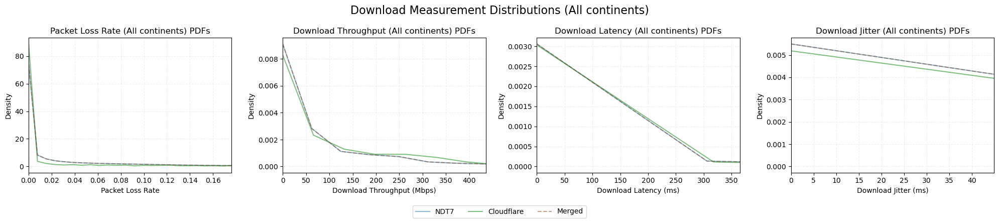

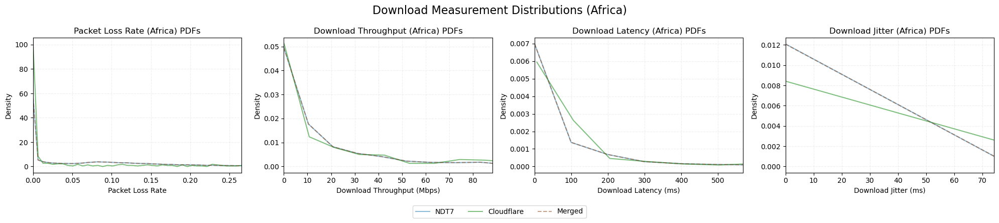

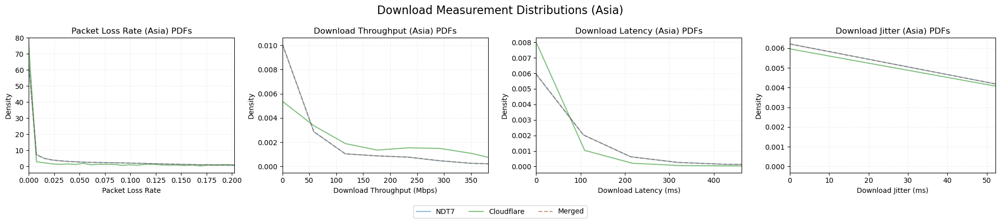

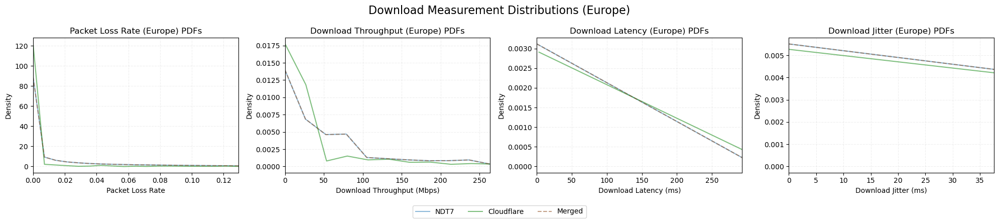

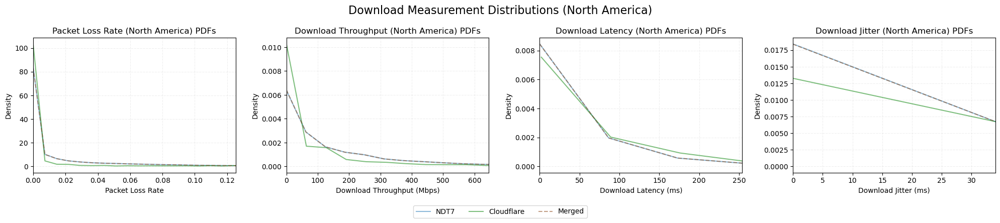

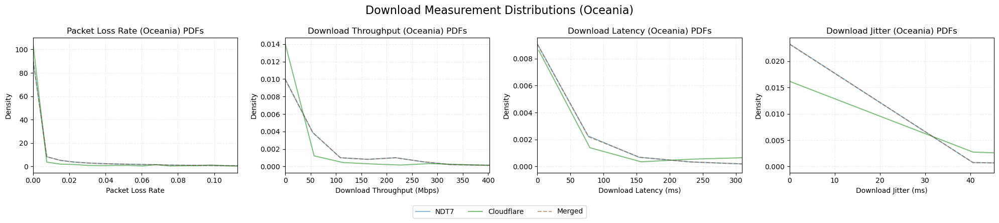

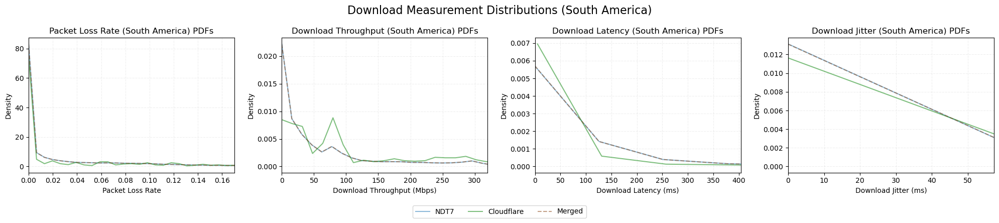




--------------------------------





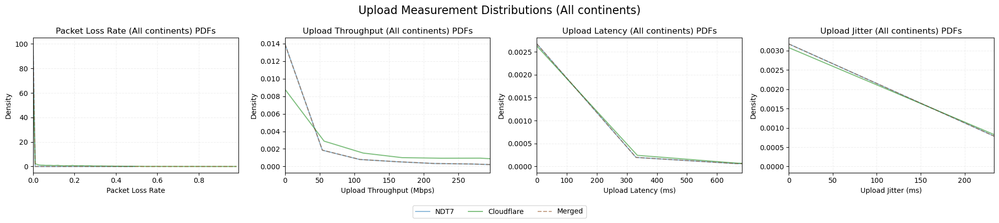

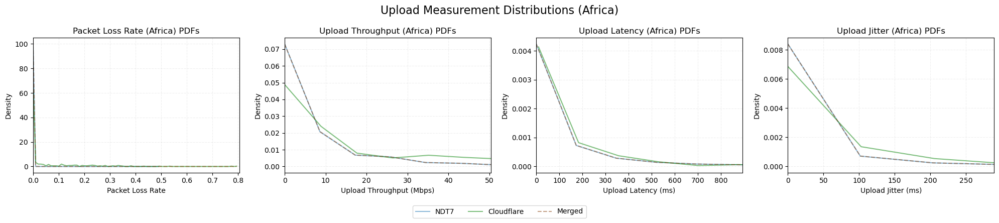

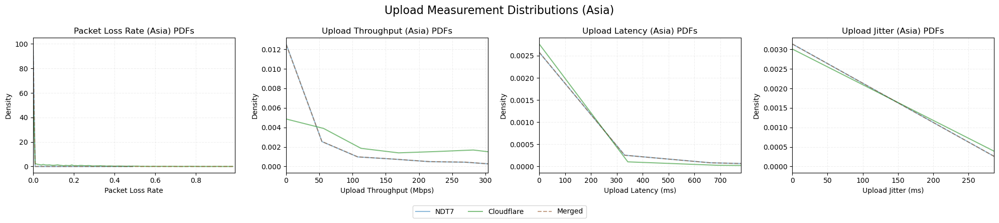

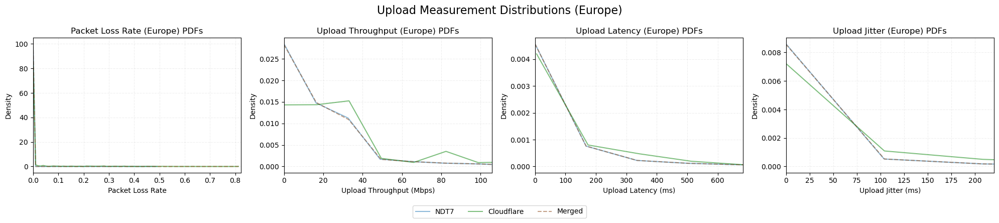

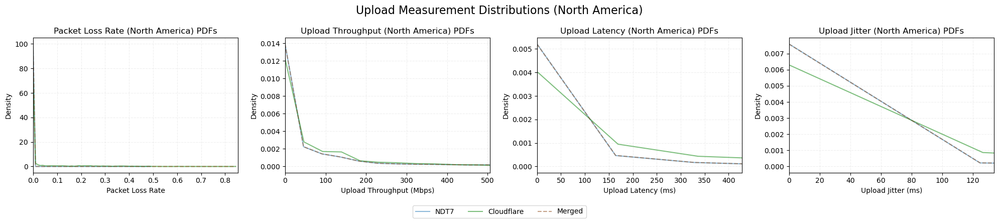

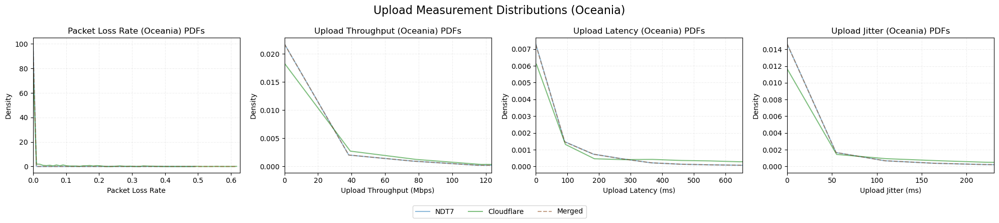

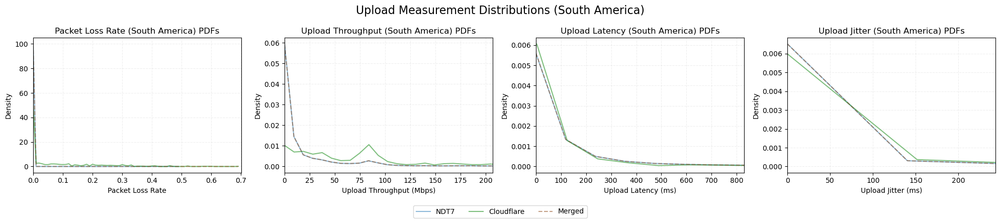

Median-Generated Cloudflare


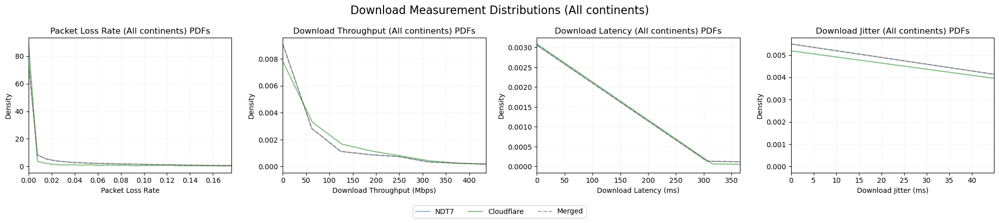

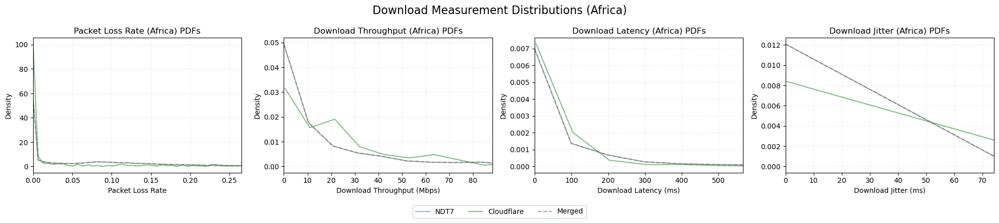

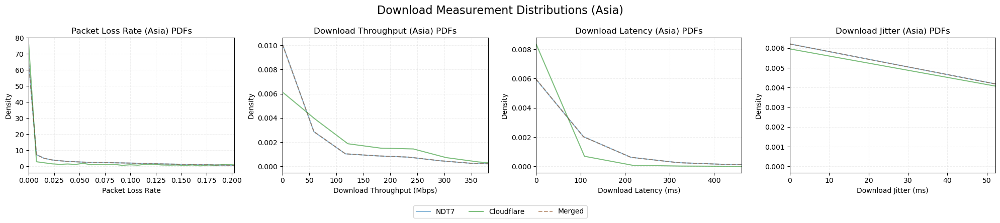

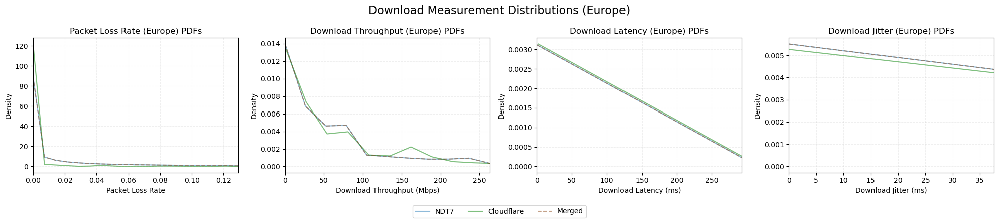

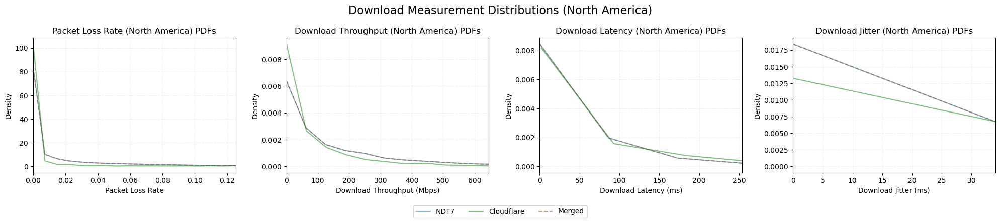

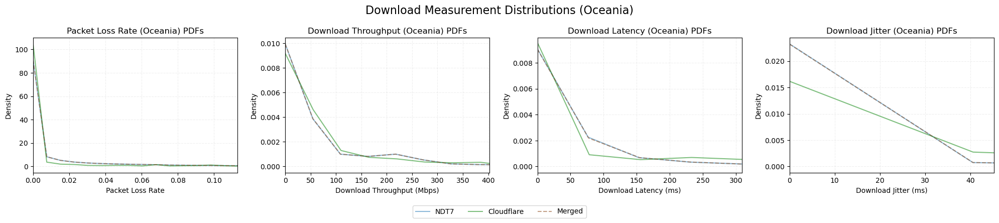

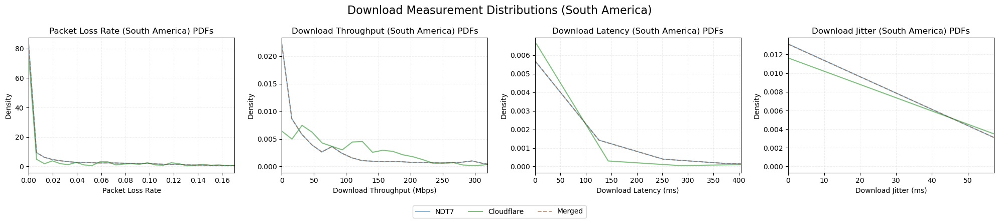




--------------------------------





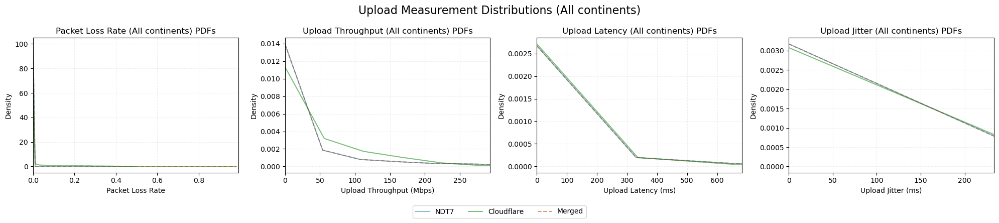

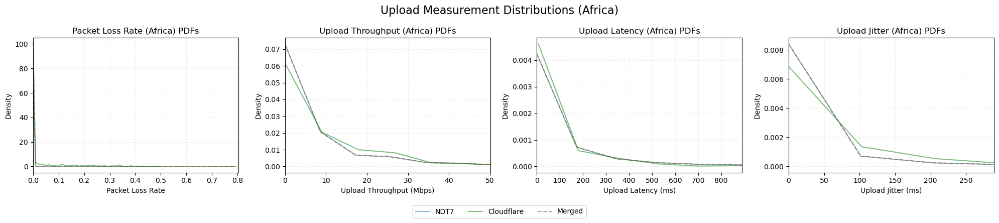

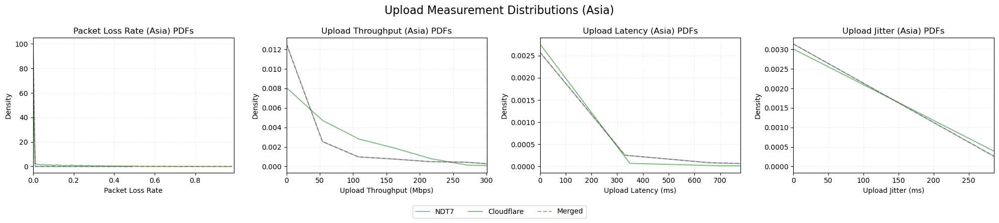

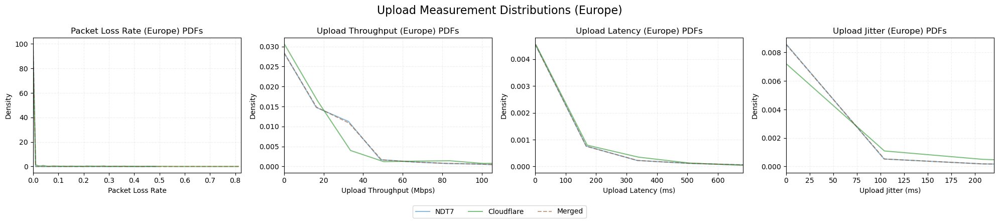

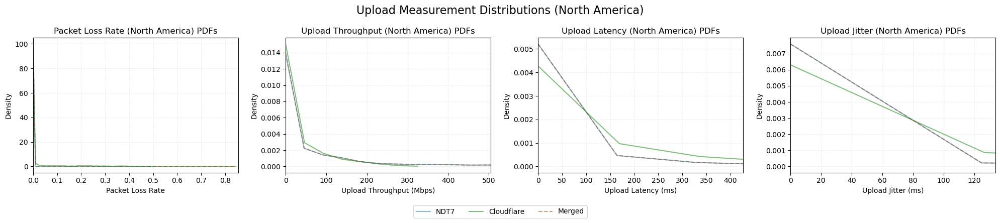

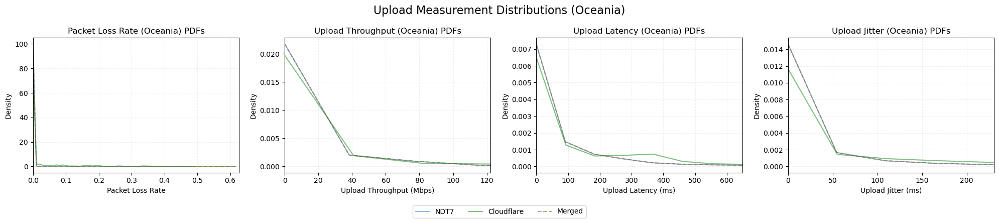

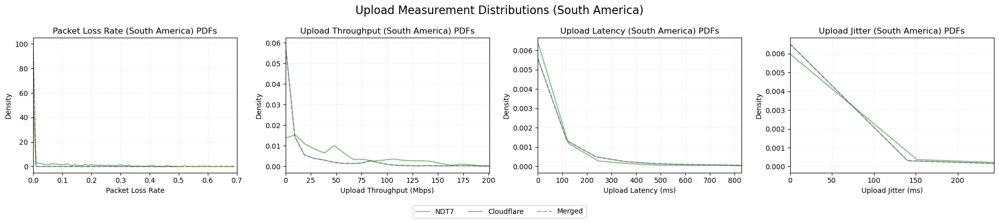

90th Percentile-Generated Cloudflare


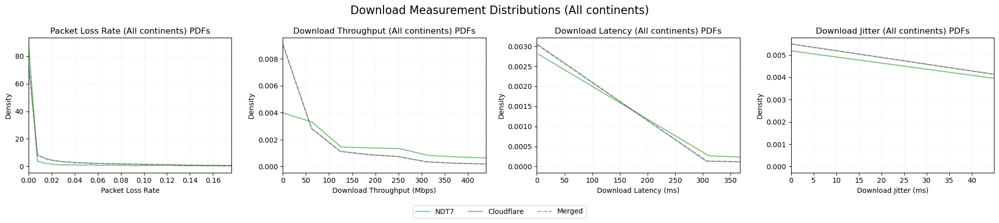

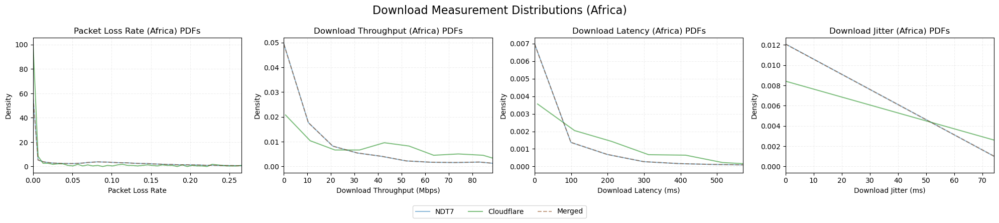

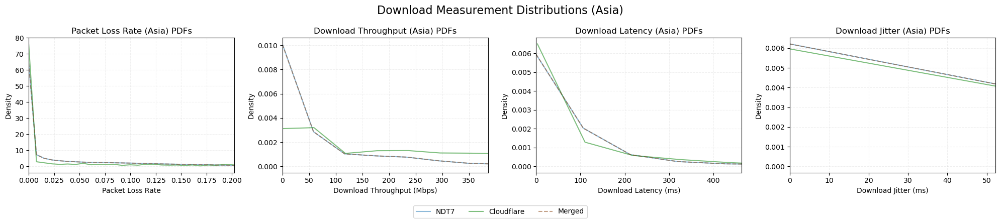

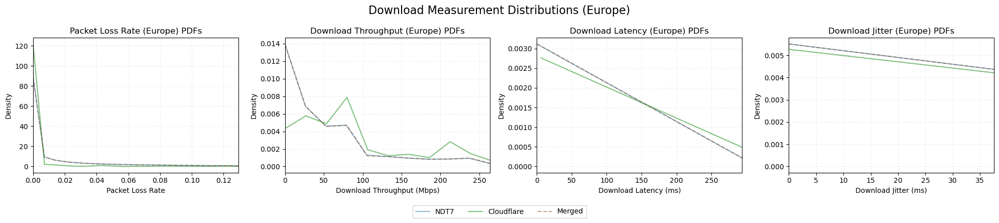

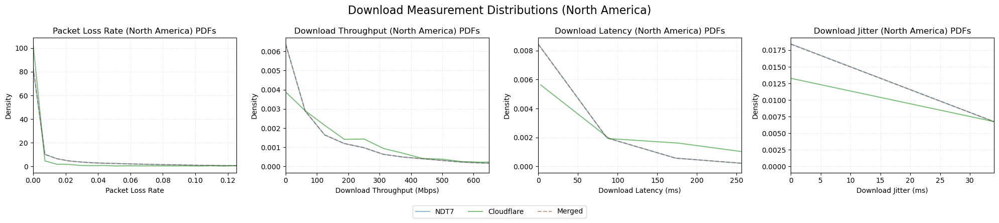

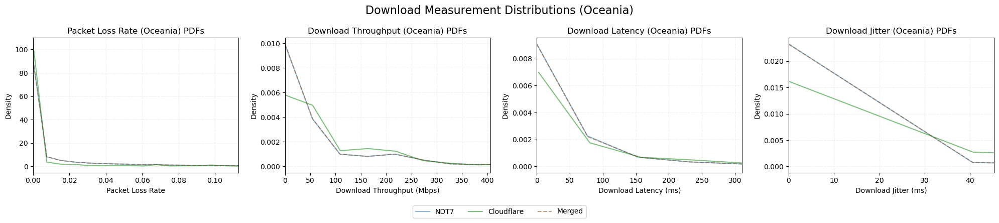

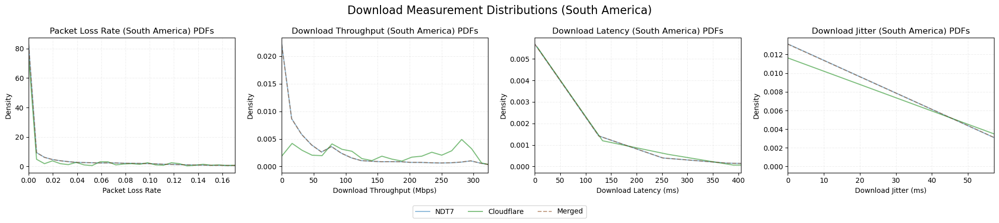




--------------------------------





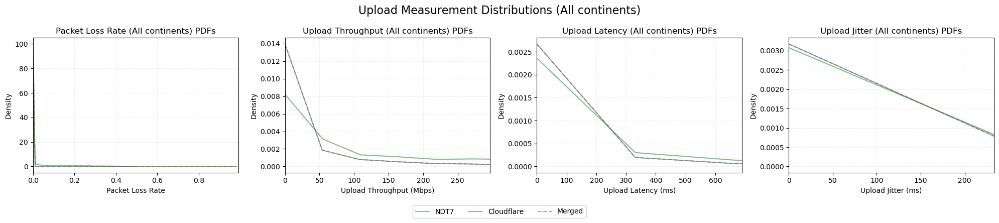

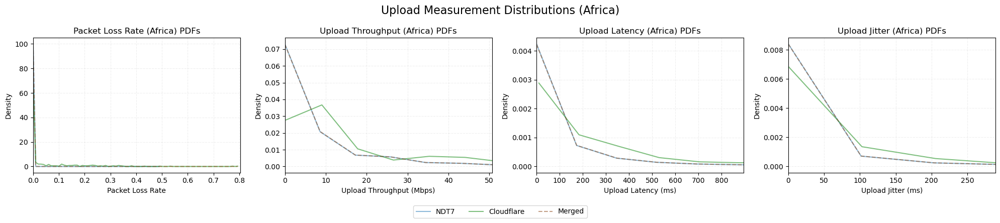

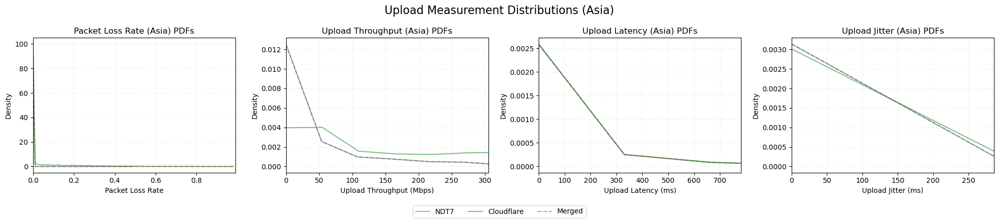

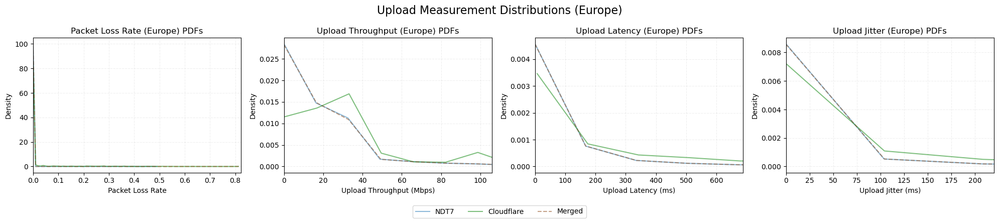

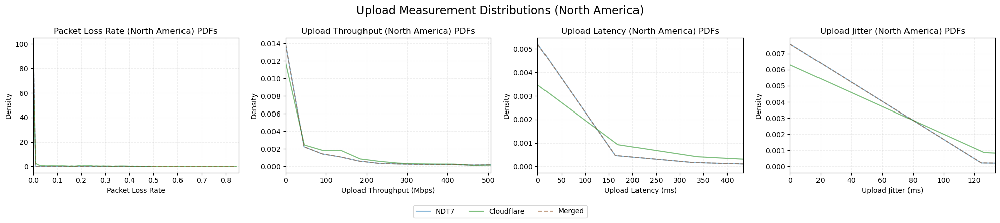

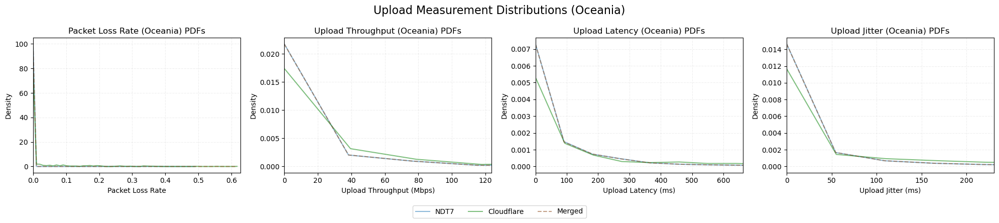

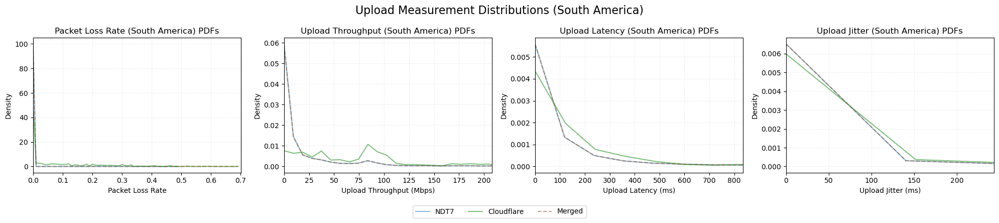

In [10]:
plot_pdfs_with_merged_all_continents(ndt7_download, ndt7_upload, cf_data_mean, 'Mean-Generated Cloudflare')
plot_pdfs_with_merged_all_continents(ndt7_download, ndt7_upload, cf_data_median, 'Median-Generated Cloudflare')
plot_pdfs_with_merged_all_continents(ndt7_download, ndt7_upload, cf_data_90th_percentile, '90th Percentile-Generated Cloudflare')

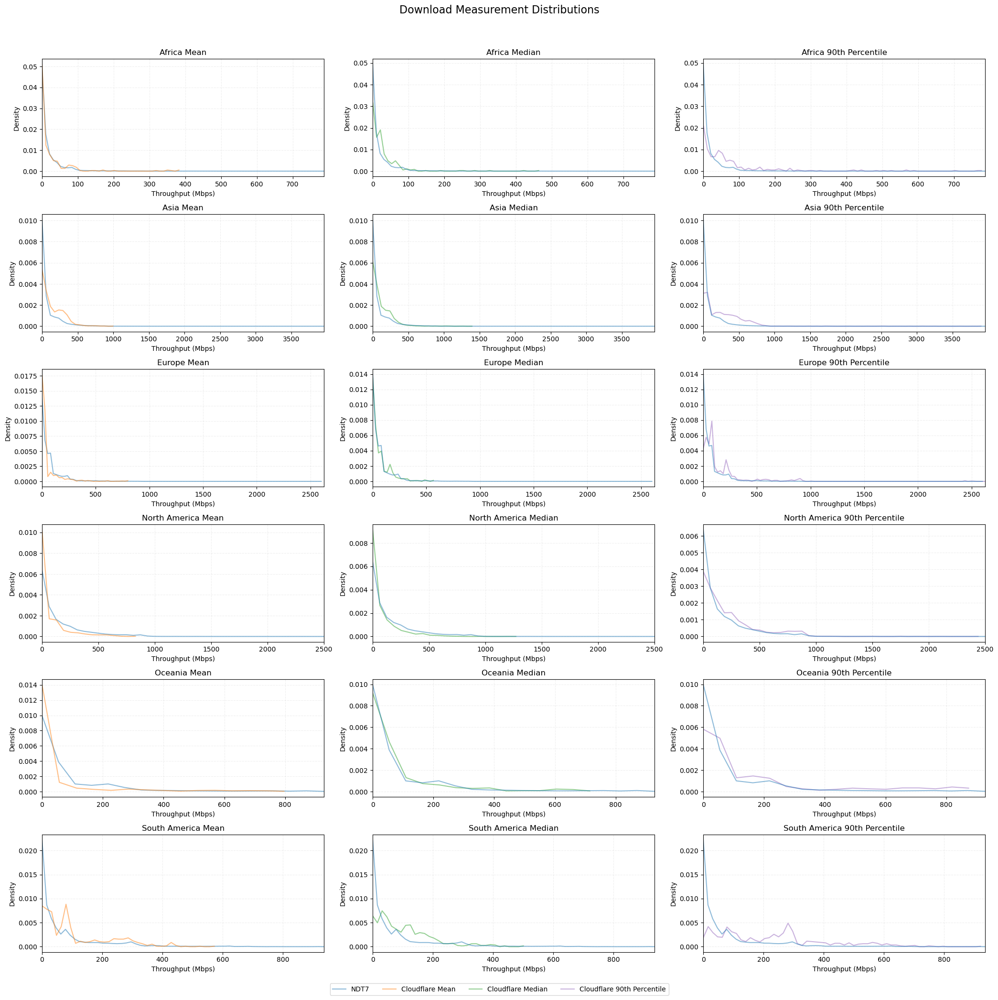

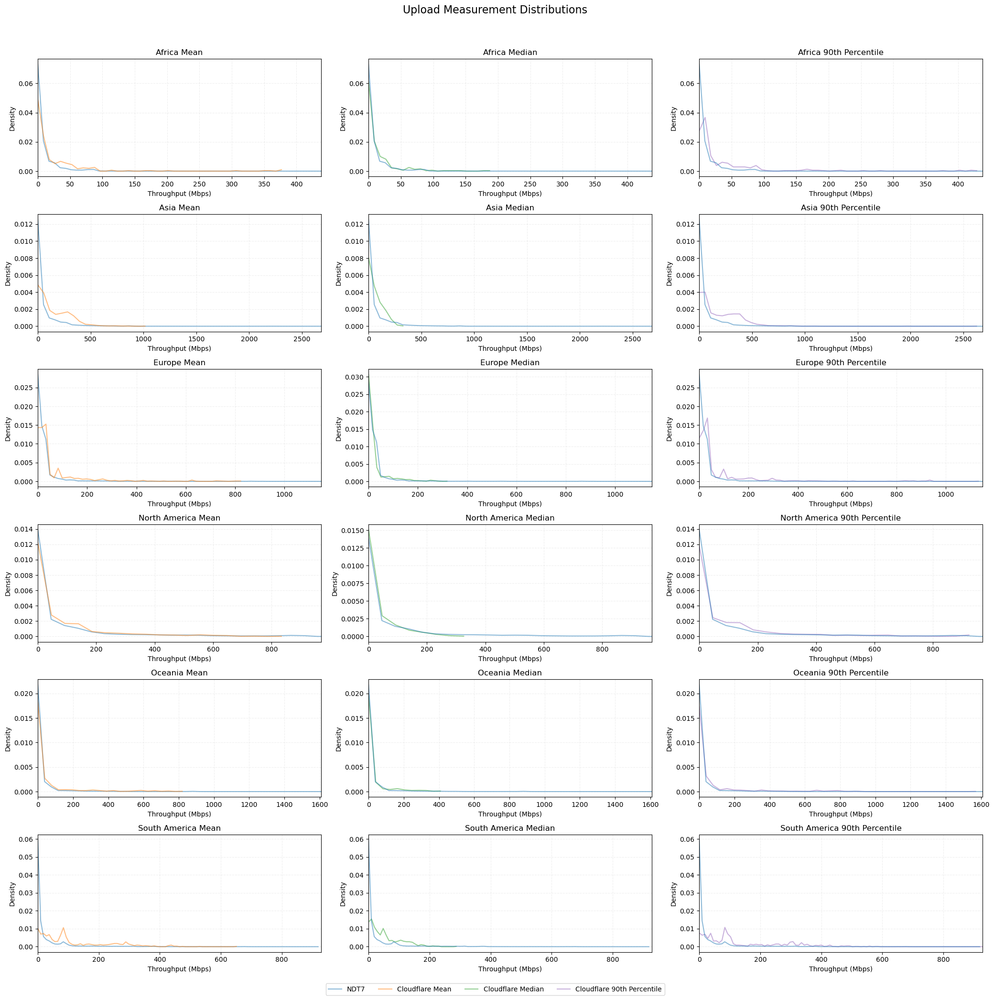

In [11]:
plot_throughput_with_all_cf_aggregations(True)
plot_throughput_with_all_cf_aggregations(False)

Starlink Measurements Only


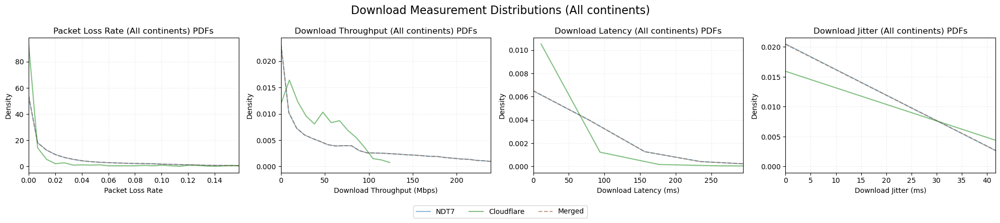

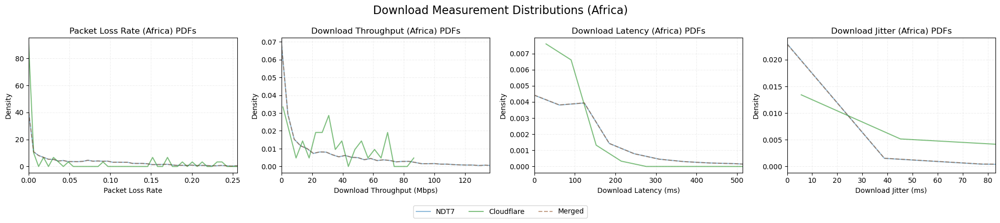

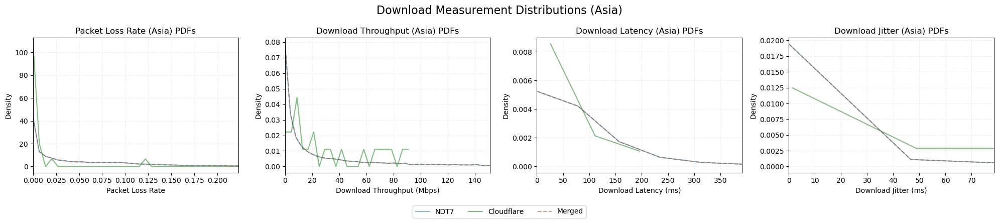

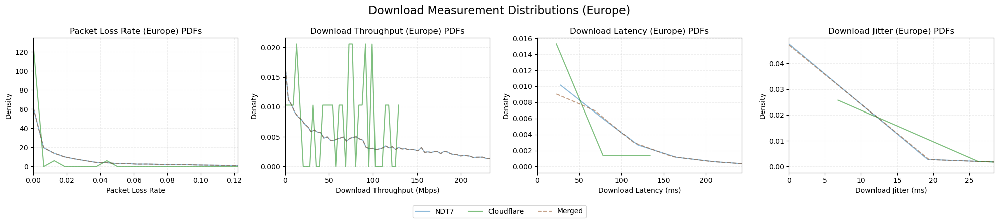

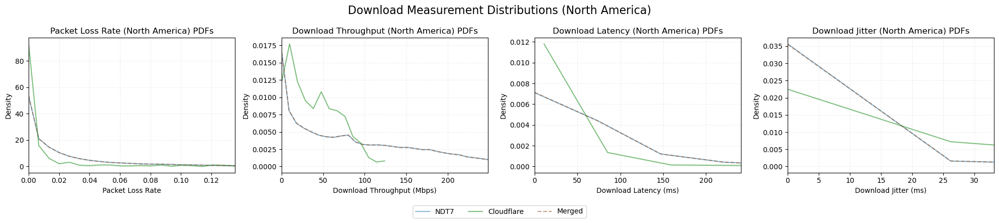

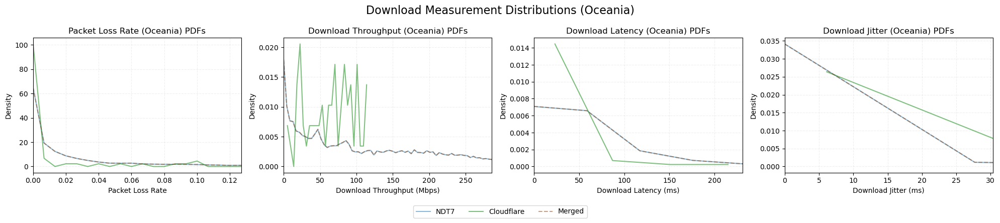

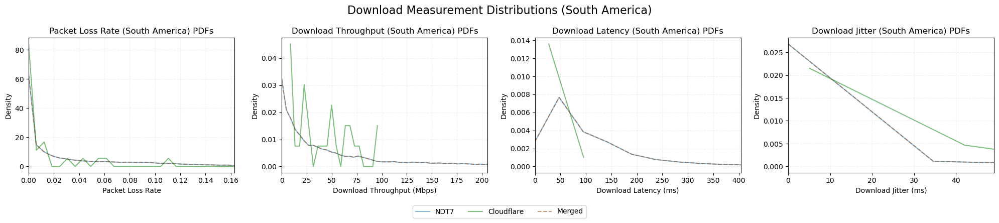




--------------------------------





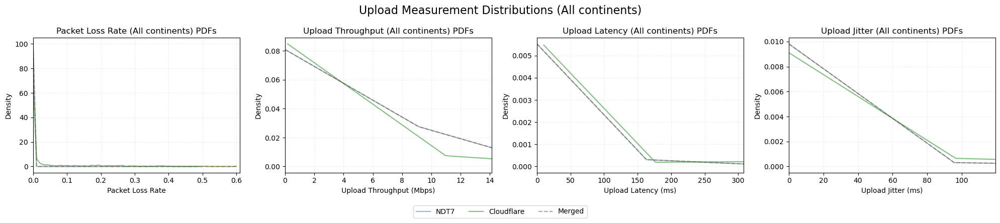

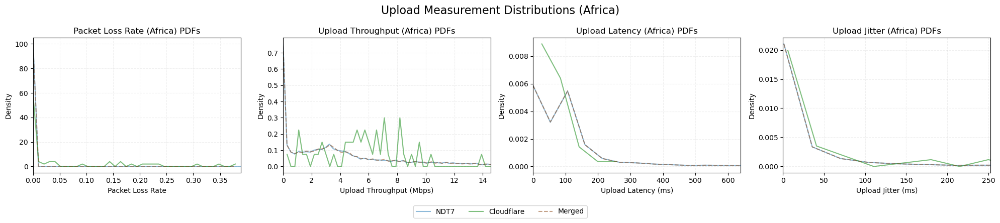

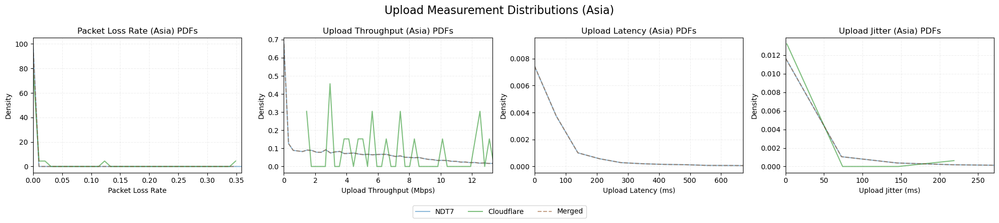

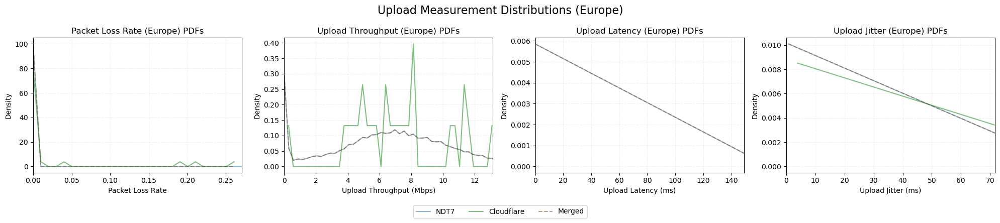

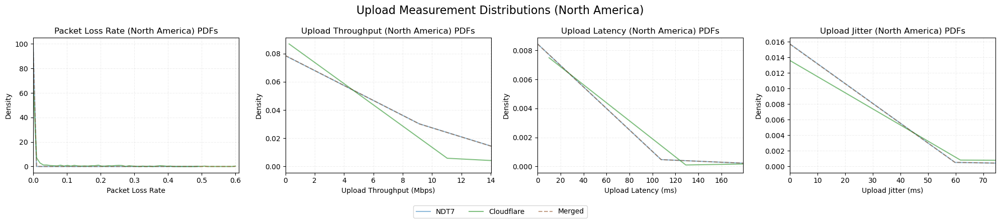

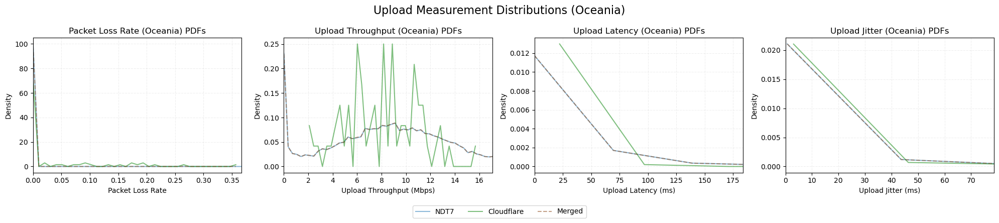

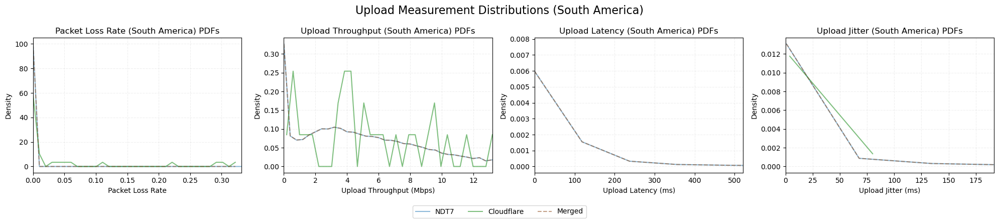

In [12]:
ndt7_download_starlink = ndt7_download[ndt7_download['asn'] == 14593]
ndt7_upload_starlink = ndt7_upload[ndt7_upload['asn'] == 14593]
cf_median_starlink = cf_data_median[cf_data_median['asn'] == 14593]

plot_pdfs_with_merged_all_continents(ndt7_download_starlink, ndt7_upload_starlink, cf_median_starlink, 'Starlink Measurements Only')

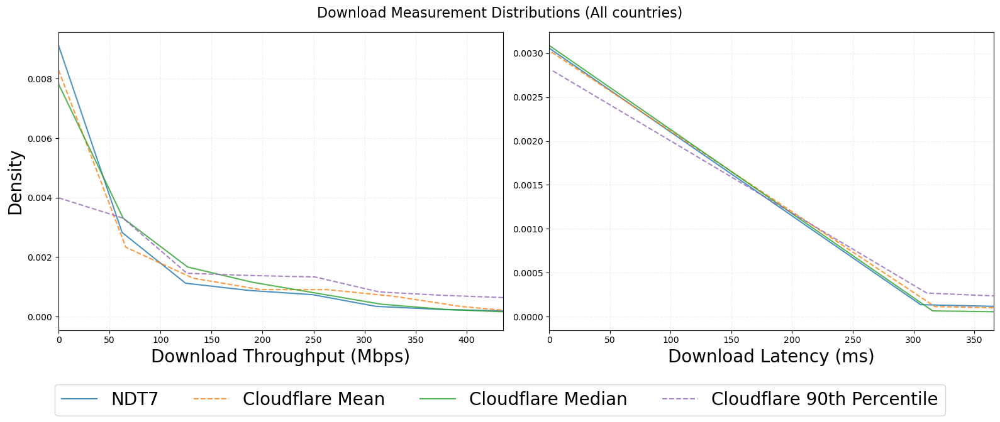

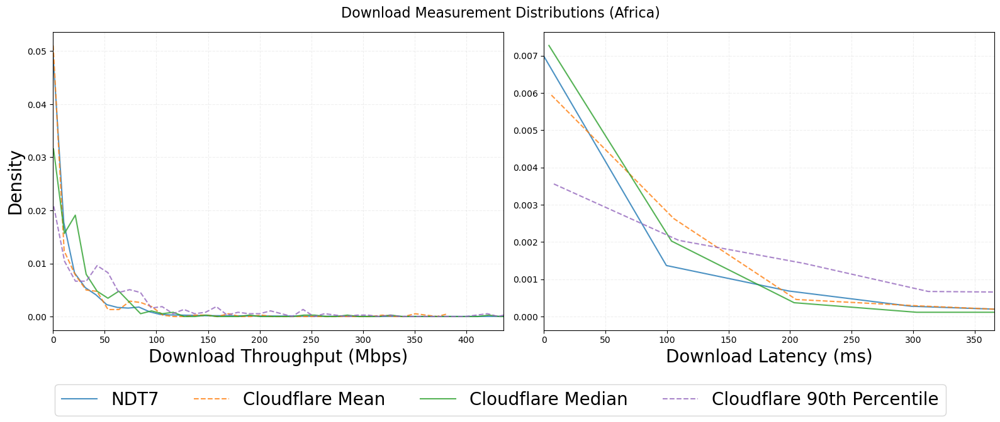

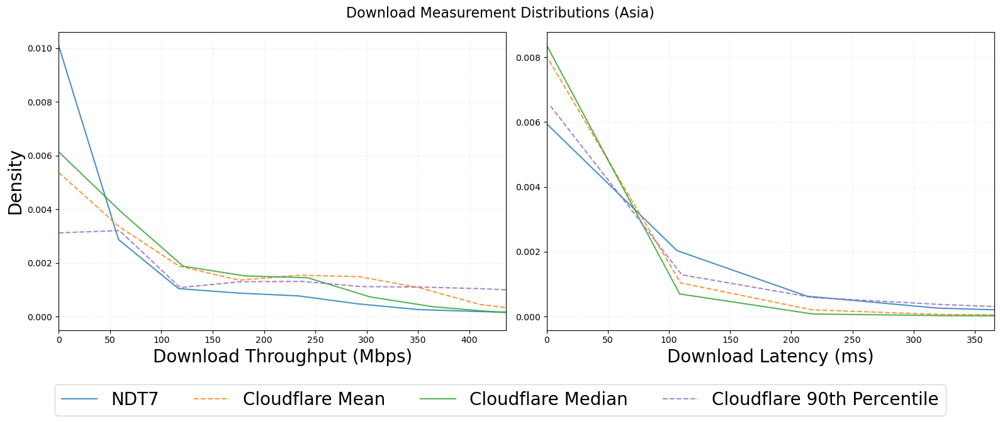

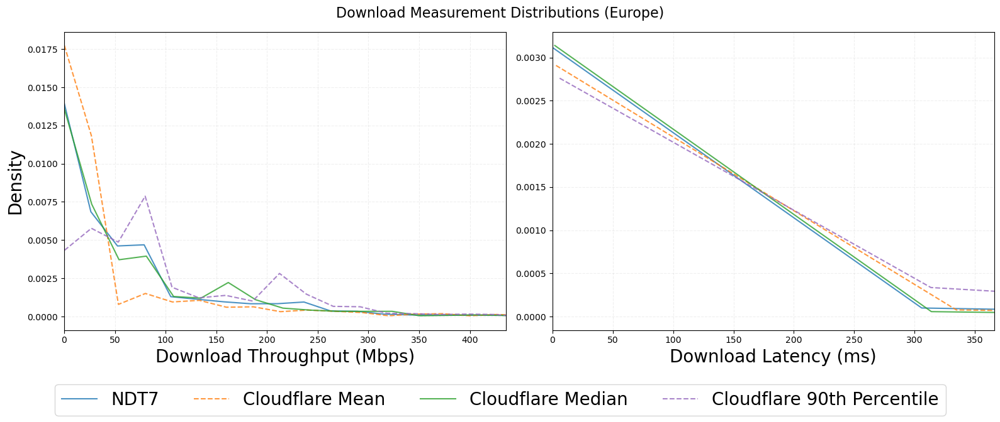

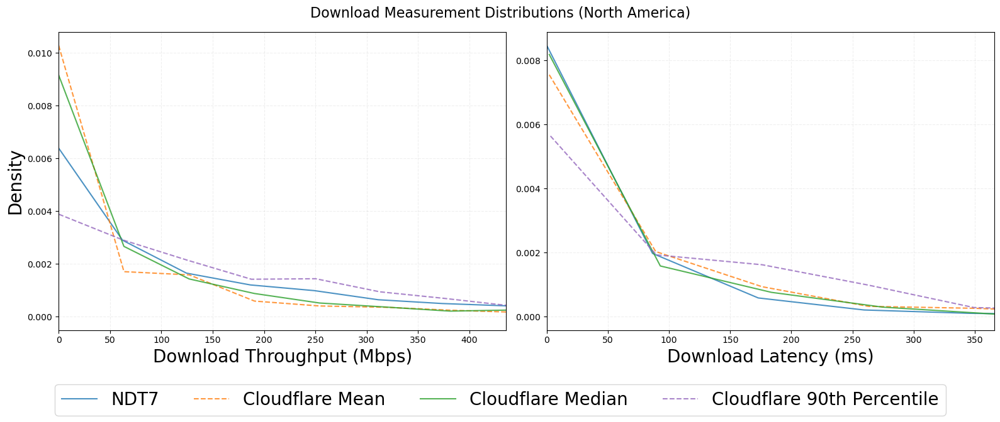

...

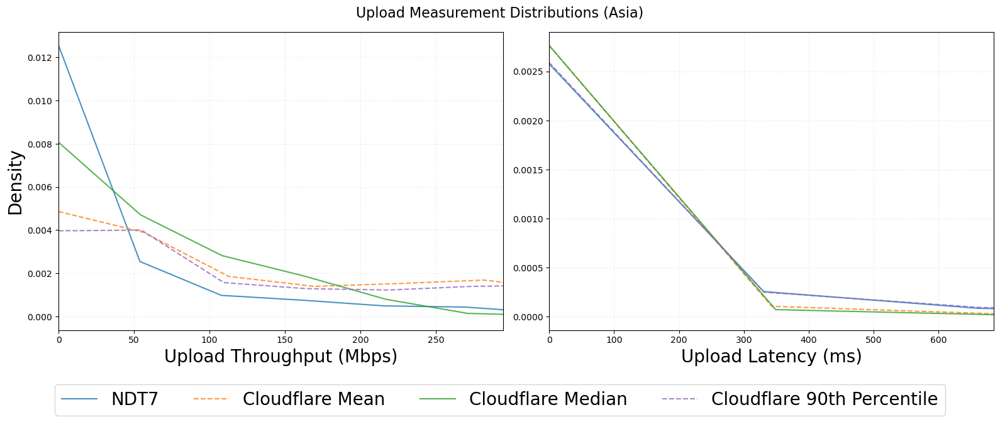

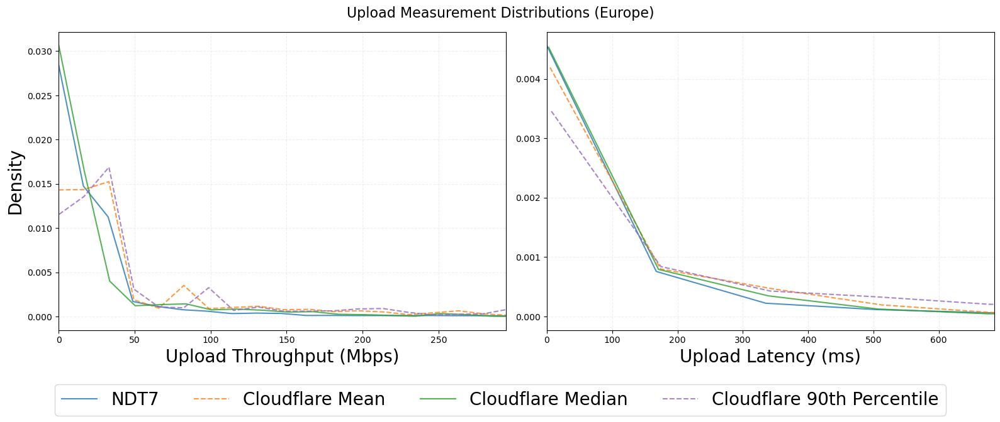

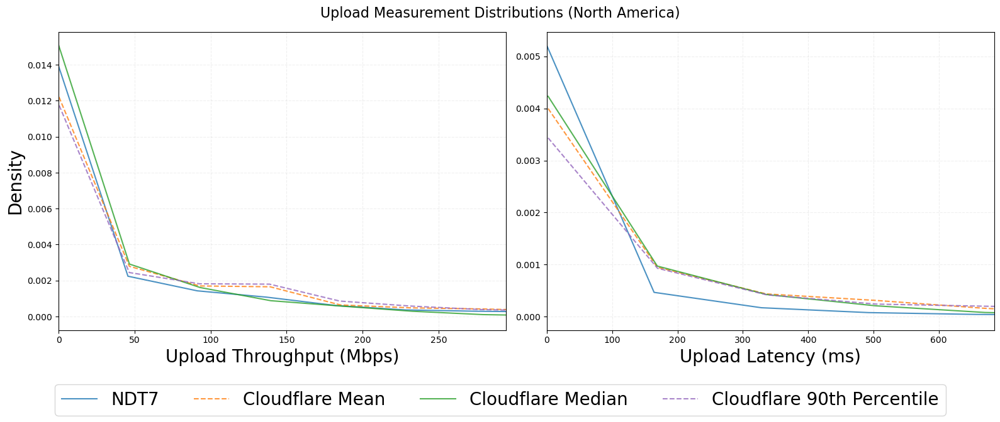

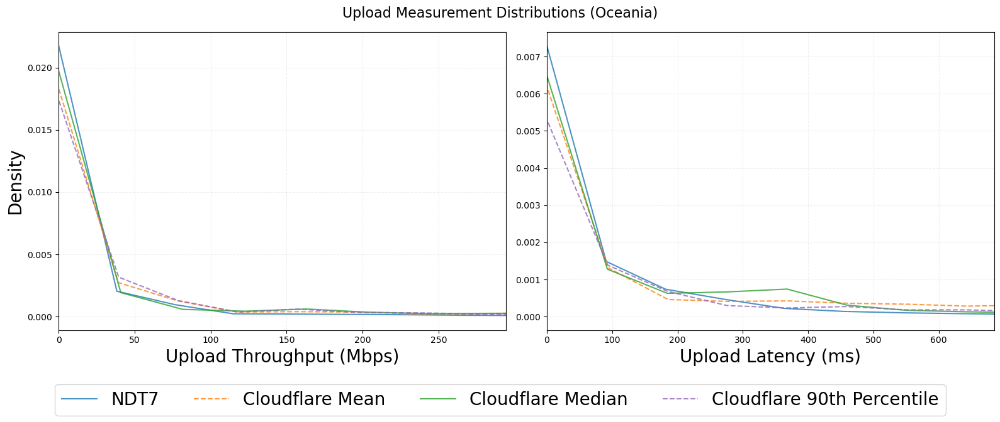

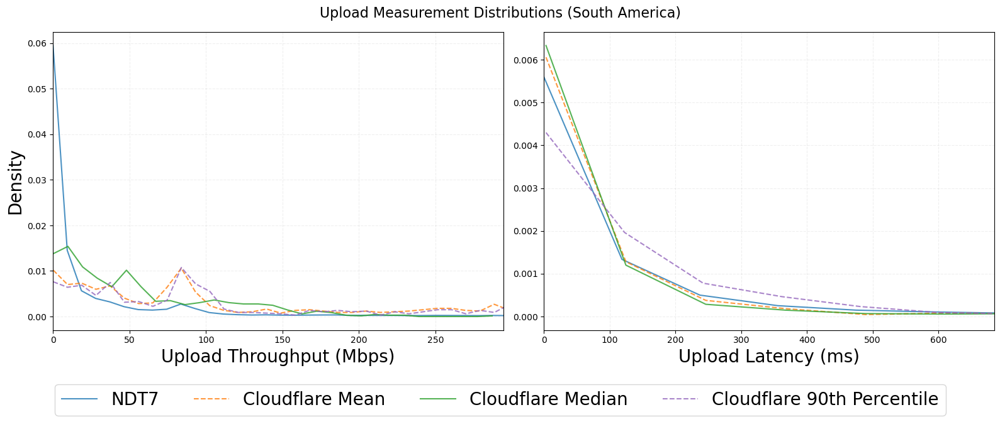

In [13]:
plot_pdfs_with_all_cf_aggregations(ndt7_download, cf_data_mean, cf_data_median, cf_data_90th_percentile, 'All countries', True)
for continent in continents:
    plot_pdfs_with_all_cf_aggregations(ndt7_download, cf_data_mean, cf_data_median, cf_data_90th_percentile, continent, True)

plot_pdfs_with_all_cf_aggregations(ndt7_upload, cf_data_mean, cf_data_median, cf_data_90th_percentile, 'All continents', False)
for continent in continents:
    plot_pdfs_with_all_cf_aggregations(ndt7_upload, cf_data_mean, cf_data_median, cf_data_90th_percentile, continent, False)


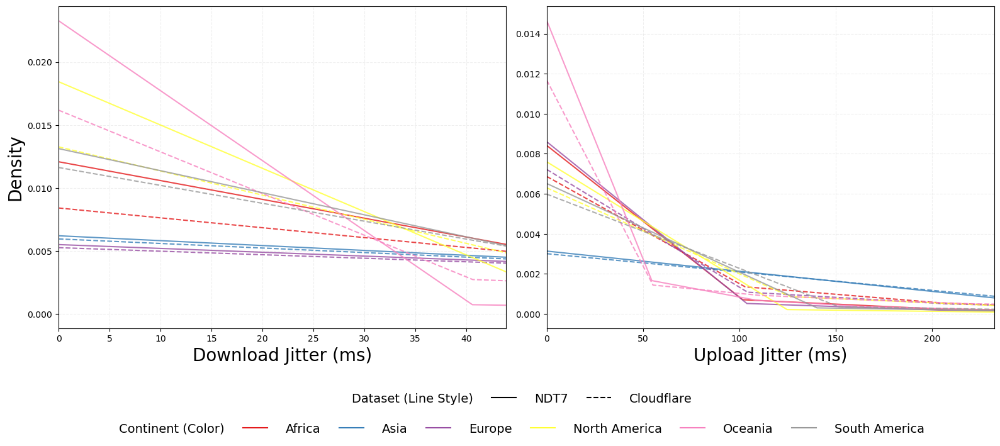

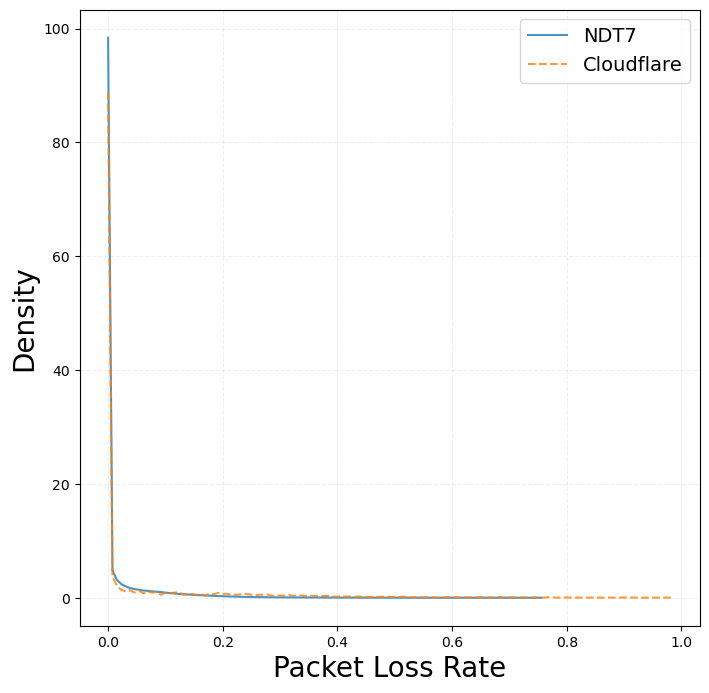

In [14]:
plot_jitter_all_continents(ndt7_download, ndt7_upload, cf_data_median)
plot_packet_loss_all(ndt7_download, ndt7_upload, cf_data_median)
